# 08wk-2: (XAI) – Class Activation Map

최규빈  
2025-04-28

<a href="https://colab.research.google.com/github/guebin/DL2025/blob/main/posts/08wk-2.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" style="text-align: left"></a>

# 1. 강의영상

In [4]:
# {{<video https://youtu.be/playlist?list=PLQqh36zP38-yoX-Rtq9TPcvAawZfu6iZx&si=DD64EseytgR75zIz>}}

# 2. Imports

In [1]:
import torch
import torchvision
import PIL
import requests
import io
import matplotlib.pyplot as plt

# 3. `torch.einsum`

## A. transpose

In [2]:
tsr = torch.arange(12).reshape(4,3)
tsr

In [3]:
tsr.t()

In [4]:
torch.einsum('ij->ji',tsr)

## B. 행렬곱

In [5]:
tsr1 = torch.arange(12).reshape(4,3).float()
tsr2 = torch.arange(15).reshape(3,5).float()

In [6]:
tsr1.shape

In [7]:
tsr2.shape

In [8]:
tsr1 @ tsr2

In [9]:
torch.einsum('ij,jk -> ik',tsr1,tsr2) 

## C. `img_plt` vs `img_pytorch`

In [667]:
r = torch.zeros(16).reshape(4,4) + 1.0
g = torch.zeros(16).reshape(4,4)
b = torch.zeros(16).reshape(4,4)

In [674]:
# torch를 쓰기 위해서는 이미지가 이렇게 저장되어있어야한다. 
img_pytorch = torch.stack([r,g,b],axis=0).reshape(1,3,4,4) 
print(img_pytorch)
print(img_pytorch.shape)

tensor([[[[1., 1., 1., 1.],
          [1., 1., 1., 1.],
          [1., 1., 1., 1.],
          [1., 1., 1., 1.]],

         [[0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.]],

         [[0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.],
          [0., 0., 0., 0.]]]])
torch.Size([1, 3, 4, 4])

-   첫채널, 두번째채널, 세번째채널

In [675]:
# matplotlib 를 쓰기 위해서는 이미지가 이렇게 저장되어있어야한다. 
img_plt = torch.stack([r,g,b],axis=-1) 
print(img_plt)
print(img_plt.shape)

tensor([[[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]],

        [[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]],

        [[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]],

        [[1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.],
         [1., 0., 0.]]])
torch.Size([4, 4, 3])

-   첫row, 두번째row, 세번째row, 네번째row

만약에 `img_pytorch`를 matplotlib 으로 보고싶다면?

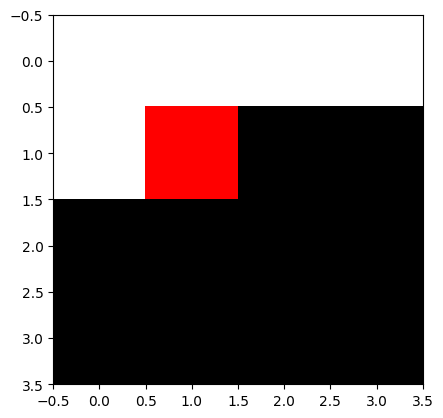

In [679]:
# 잘못된코드
plt.imshow(img_pytorch.reshape(4,4,3))

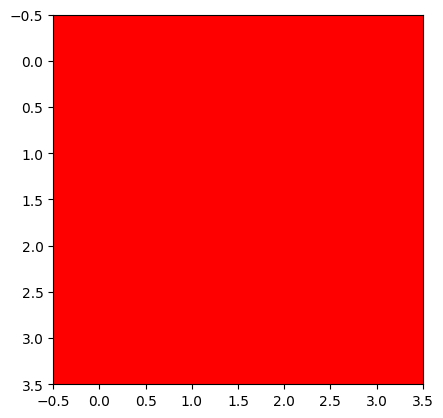

In [684]:
# 올바른코드1
plt.imshow(torch.einsum('cij -> ijc',img_pytorch.squeeze()))

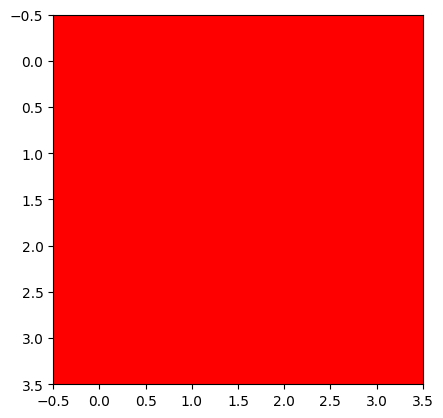

In [685]:
# 올바른코드2
plt.imshow(img_pytorch.squeeze().permute(1,2,0))

# 4. 이미지 자료 처리

## A. 데이터

In [686]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category'
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category'
)

In [687]:
train_dataset[0]

## B. 이미지 변환

`-` `x_pil` 에 `resize`, `to_tensor` 를 적용해보기

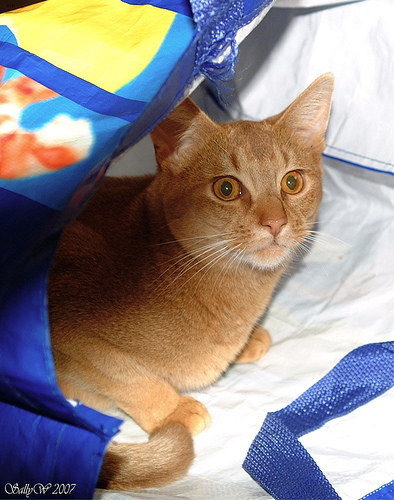

In [524]:
x_pil = train_dataset[0][0]
x_pil

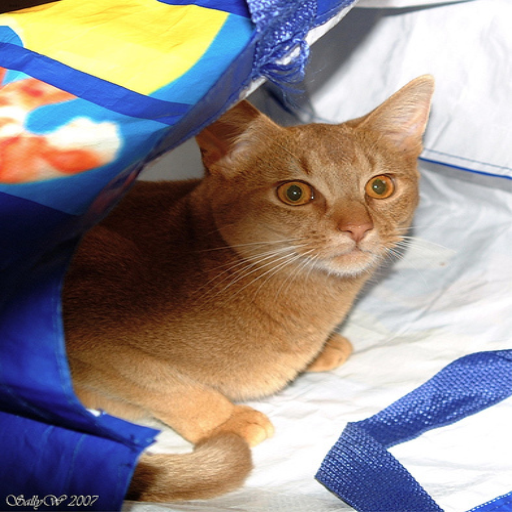

In [689]:
resize = torchvision.transforms.Resize((512,512))
resize(x_pil)

In [690]:
to_tensor = torchvision.transforms.ToTensor()
to_tensor(resize(x_pil)).shape

`-` compose로 여러변환을 묶은뒤 `x_pil`에 적용해보기

In [691]:
compose = torchvision.transforms.Compose(
    [resize,to_tensor]
)

In [692]:
compose(x_pil).shape

`-` 크기가 8인 배치를 만들어 보기

In [539]:
Xm = torch.stack([compose(train_dataset[i][0]) for i in range(8)],axis=0)

In [541]:
Xm.shape

# 5. AP Layer

## A. AP layer

In [719]:
ap = torch.nn.AdaptiveAvgPool2d(output_size=1)
ap

In [720]:
X = torch.arange(1*3*4*4).reshape(1,3,4,4)*1.0 
X

In [721]:
ap(X) # 채널별로 평균을 구해줌. 

In [722]:
r,g,b = X[0]

In [723]:
r.mean(), g.mean(), b.mean()

In [724]:
ap(r), ap(g), ap(b) 

## B. AP, Linear의 교환

`-` 신기한 거 보여줄까요??

In [725]:
X = torch.arange(1*3*4*4).reshape(1,3,4,4)*1.0 
r,g,b = X[0]

In [726]:
ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3

In [727]:
ap(r*0.1 + g*0.2 + b*0.3)

-   별로 안 신기함.. 당연한것 아니야?

`-` `torch.nn.Linear()` 와 `torch.nn.Flatten()` 를 이용한 구현

In [728]:
flattn = torch.nn.Flatten()
linr = torch.nn.Linear(3,1,bias=False)

In [729]:
# ap(r)*0.1 + ap(g)*0.2 + ap(b)*0.3
linr.weight.data = torch.tensor([[0.1, 0.2, 0.3]])
linr(flattn(ap(X)))

In [730]:
#ap(r*0.1 + g*0.2 + b*0.3) ## 각각의 픽셀에 l을 취하고 그 결과에 ap를 취해야함 
flattn(ap(torch.einsum('ocij,kc -> okij',X,linr.weight.data)))

`-` 정리

In [734]:
# 계산1: x를 ap, flatten, linear 순서로 적용
print(f"{X.shape} -- X")
print(f"{ap(X).shape} -- ap(X)")
print(f"{flattn(ap(X)).shape} -- flattn(ap(X))")
print(f"{linr(flattn(ap(X))).shape} -- linr(flattn(ap(X)))")

torch.Size([1, 3, 4, 4]) -- X
torch.Size([1, 3, 1, 1]) -- ap(X)
torch.Size([1, 3]) -- flattn(ap(X))
torch.Size([1, 1]) -- linr(flattn(ap(X)))

In [736]:
# 계산2: x를 linear, ap, flatten 순서로 적용
print(f"{X.shape} -- X")
print(f"{torch.einsum('ocij,kc -> okij',X,linr.weight.data).shape} -- l(X)")
print(f"{ap(torch.einsum('ocij,kc -> okij',X,linr.weight.data)).shape} -- ap(linr(X))")
print(f"{flatten(ap(torch.einsum('ocij,kc -> okij',X,linr.weight.data))).shape} -- flattn(ap(linr(X)))")

torch.Size([1, 3, 4, 4]) -- X
torch.Size([1, 1, 4, 4]) -- l(X)
torch.Size([1, 1, 1, 1]) -- ap(linr(X))
torch.Size([1, 1]) -- flattn(ap(linr(X)))

# 6. CAM(Zhou et al. 2016)의 구현

ref: <https://arxiv.org/abs/1512.04150>

`-` 이 강의노트는 위의 논문의 내용을 재구성하였음.

## A. 0단계 – (X,y), (XX,yy)

In [619]:
train_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='trainval',
    download=True,
    target_types='binary-category',
)
test_dataset = torchvision.datasets.OxfordIIITPet(
    root='./data', 
    split='test',
    download=True,
    target_types='binary-category',
)

In [620]:
len(train_dataset), len(test_dataset)

In [621]:
compose = torchvision.transforms.Compose([
    torchvision.transforms.Resize([512,512]),
    torchvision.transforms.ToTensor()
])

In [622]:
X = torch.stack([compose(train_dataset[i][0]) for i in range(3680)],axis=0)
XX = torch.stack([compose(test_dataset[i][0]) for i in range(3669)],axis=0)

In [623]:
y = torch.tensor([train_dataset[i][1] for i in range(3680)]).reshape(-1,1).float()
yy = torch.tensor([test_dataset[i][1] for i in range(3669)]).reshape(-1,1).float()

## B. 1단계 – 이미지분류 잘하는 네트워크 선택 후 학습

In [624]:
torch.manual_seed(43052)
#--Step1
# make (X,y), (XX,yy)
ds_train = torch.utils.data.TensorDataset(X,y)
dl_train = torch.utils.data.DataLoader(ds_train,batch_size=32,shuffle=True)
ds_test = torch.utils.data.TensorDataset(XX,yy)
dl_test = torch.utils.data.DataLoader(ds_test,batch_size=32,shuffle=True)
#--Step2
resnet18 = torchvision.models.resnet18(pretrained=True)
resnet18.fc = torch.nn.Linear(512,1)
loss_fn = torch.nn.BCEWithLogitsLoss()
optimizr = torch.optim.Adam(resnet18.parameters(),lr=1e-5)
#--Step3
resnet18.to("cuda:0")
for epoc in range(3):
    resnet18.train()
    for Xm,ym in dl_train:
        Xm = Xm.to("cuda:0")
        ym = ym.to("cuda:0")
        #1
        netout = resnet18(Xm)
        #2
        loss = loss_fn(netout,ym) 
        #3
        loss.backward()
        #4 
        optimizr.step()
        optimizr.zero_grad()
    #---# 
    resnet18.eval()
    s = 0 
    for Xm,ym in dl_train:
        Xm = Xm.to("cuda:0")
        ym = ym.to("cuda:0")
        s = s + ((resnet18(Xm).data > 0) == ym).sum().item()        
    acc = s/len(X)
    print(f"train_accuracy = {acc:.4f}")
#--Step4
resnet18.eval()
s = 0 
for Xm,ym in dl_test:
    Xm = Xm.to("cuda:0")
    ym = ym.to("cuda:0")
    s = s + ((resnet18(Xm).data > 0) == ym).sum().item()
acc = s/len(XX)
print(f"test_accuracy = {acc:.4f}")

train_accuracy = 0.9815
train_accuracy = 0.9973
train_accuracy = 0.9995
test_accuracy = 0.9951

## C. 2단계– Linear와 AP의 순서를 바꿈

In [635]:
resnet18._forward_impl??

In [626]:
stem = torch.nn.Sequential(
    torch.nn.Sequential(
        resnet18.conv1,
        resnet18.bn1,
        resnet18.relu,
        resnet18.maxpool,
    ),
    resnet18.layer1,
    resnet18.layer2,
    resnet18.layer3,
    resnet18.layer4
)

In [627]:
head = torch.nn.Sequential(
    resnet18.avgpool,
    torch.nn.Flatten(),
    resnet18.fc
)

In [628]:
net = torch.nn.Sequential(
    stem, head
)

`-` 1개의 observation을 고정

In [636]:
x =  X[[0]].to("cuda:0")
net(x),resnet18(x)

`-` 하나의 observation이 yhat까지 나오는 과정

In [637]:
# 계산방식1: 원래계산방식
ap = head[0]
flattn = head[1]
linr = head[2]
print(f"{x.shape} -- x")
print(f"{stem(x).shape} -- stem(x)")
print(f"{ap(stem(x)).shape} -- ap(stem(x))")
print(f"{flattn(ap(stem(x))).shape} -- flattn(ap(stem(x)))")
print(f"{linr(flattn(ap(stem(x)))).shape} -- linr(flattn(ap(stem(x))))")
linr(flattn(ap(stem(x)))), net(x)

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- stem(x)
torch.Size([1, 512, 1, 1]) -- ap(stem(x))
torch.Size([1, 512]) -- flattn(ap(stem(x)))
torch.Size([1, 1]) -- linr(flattn(ap(stem(x))))

**전체 네트워크**
$$\underset{(1,3,512,512)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{ap}{\to} \underset{(1,512,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,512)}{{\boldsymbol \sharp}}\overset{linr}{\to} \underset{(1,1)}{\hat{\boldsymbol y}}\right) = [[-5.5581]]$$

**바꾸고 싶은 네트워크**
$$\underset{(1,3,224,224)}{\boldsymbol x} \overset{stem}{\to} \left( \underset{(1,512,16,16)}{\tilde{\boldsymbol x}} \overset{\_linr}{\to} \underset{(1,2,16,16)}{{\boldsymbol \sharp}}\overset{ap}{\to} \underset{(1,1,1,1)}{{\boldsymbol \sharp}}\overset{flattn}{\to} \underset{(1,1)}{\hat{\boldsymbol y}}\right) = [[-5.5581]]$$

In [638]:
# 계산방식2: head의 순서를 바꾼 계산
ap = head[0]
flattn = head[1]
linr = head[2]
def _linr(xtilde):
    return torch.einsum('ocij,kc -> okij', xtilde, linr.weight.data) + linr.bias.data
print(f"{x.shape} -- x")
print(f"{stem(x).shape} -- stem(x)")
print(f"{_linr(stem(x)).shape} -- _linr(stem(x))")
print(f"{ap(_linr(stem(x))).shape} -- ap(_linr(stem(x)))")
print(f"{flattn(ap(_linr(stem(x)))).shape} -- flattn(ap(_linr(stem(x)))))")
net(x), flattn(ap(_linr(stem(x))))

torch.Size([1, 3, 512, 512]) -- x
torch.Size([1, 512, 16, 16]) -- stem(x)
torch.Size([1, 1, 16, 16]) -- _linr(stem(x))
torch.Size([1, 1, 1, 1]) -- ap(_linr(stem(x)))
torch.Size([1, 1]) -- flattn(ap(_linr(stem(x)))))

-   참고: 여기에서 `_linr`는 (1,512,16,16)의 each pixel에
    `linr=torch.nn.Linear(512,1)`를 수행함.

### $\star$ 잠깐 멈추고 생각 좀 해보자..

`-` 입력이미지

In [639]:
x

`-` 원래 계산방식을 그대로 적용하고 결과를 해석

In [640]:
linr(flattn(ap(stem(x))))

`-` 바뀐 계산방식을 적용해볼까?

In [641]:
flattn(ap(_linr(stem(x))))

`-` 좀더 파고들어서 분석해보자.

In [642]:
_linr(stem(x)).shape

In [643]:
_linr(stem(x)).long()

-   여러값들이 있지만 아무튼 이 값들의 평균은 -5.5581임.
-   이 값들이 작을수록 이 그림은 고양이라는 의미임
-   그런데 살펴보니 대부분의 위치에서 0에 가까운 값을 가지고, 특정
    위치에서만 엄청 작은값이 있어서 -5.5581이라는 값이 나온 것임.
-   특정위치에 존재하는 엄청 작은 값들은, `x`가 고양이 이미지라고
    판단하는 근거가 된다.

$$\underset{(1,2,16,16)}{{\boldsymbol \sharp}:={\bf WHY}}\overset{ap}{\to} \underset{(1,2,1,1)}{{\boldsymbol \sharp}}\overset{flatten}{\to} \underset{(1,1)}{\hat{\boldsymbol y}} = [[-5.5581]]$$

## D. 3단계 – WHY 시각화

`-` 시각화1

In [644]:
why = _linr(stem(x))

In [645]:
why.shape

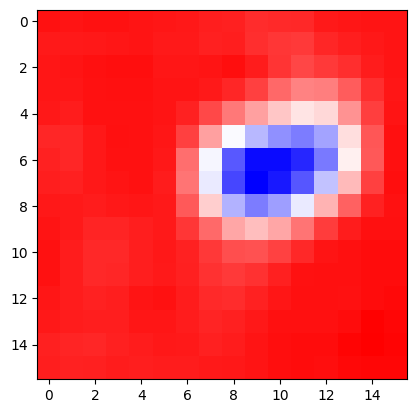

In [646]:
plt.imshow(why.squeeze().to("cpu").detach(), cmap='bwr')

In [647]:
why.shape

In [648]:
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512, 512),
    mode='bilinear',
    align_corners=False
)

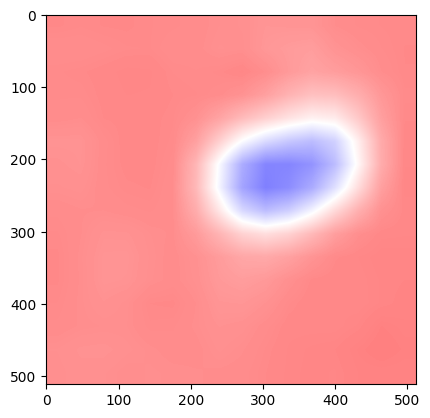

In [649]:
plt.imshow(
    why_resized.squeeze().to("cpu").detach(),
    cmap="bwr",
    alpha=0.5,
)

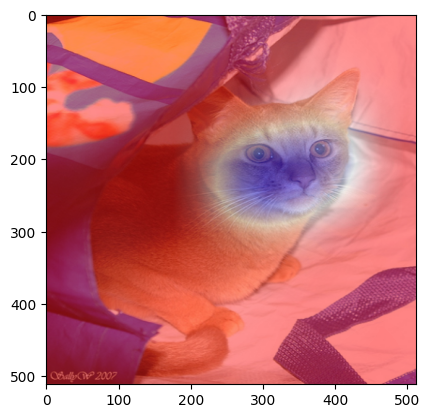

In [650]:
plt.imshow(x.squeeze().permute(1,2,0).cpu().detach())
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="bwr",alpha=0.5)

`-` 시각화2

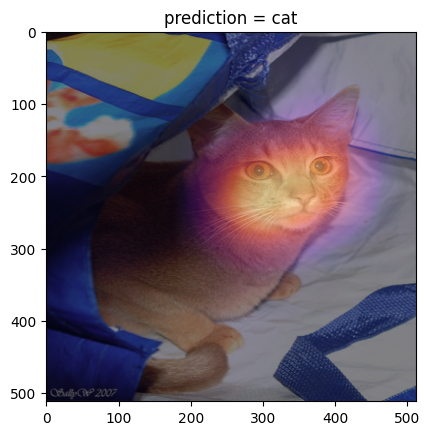

In [653]:
x = X[[0]].to("cuda:0")
if net(x)>0:
    pred = "dog"
    why = _linr(stem(x))
else:
    pred = "cat"
    why = - _linr(stem(x))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512, 512),
    mode='bilinear',
    align_corners=False
)
plt.imshow(x.squeeze().permute(1,2,0).cpu().detach())
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
plt.title(f"prediction = {pred}");

`-` 시각화3 – 하니를 시각화해보자.

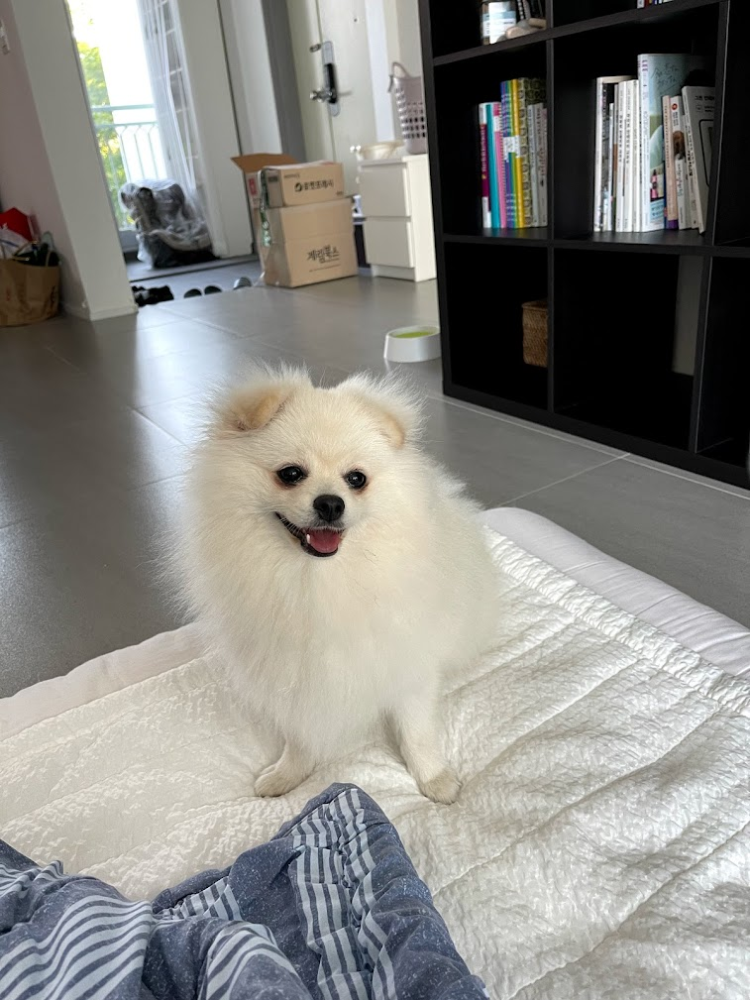

In [657]:
url = 'https://github.com/guebin/DL2024/blob/main/imgs/01wk-hani1.jpeg?raw=true'
hani_pil = PIL.Image.open(io.BytesIO(requests.get(url).content))
hani_pil

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000002].

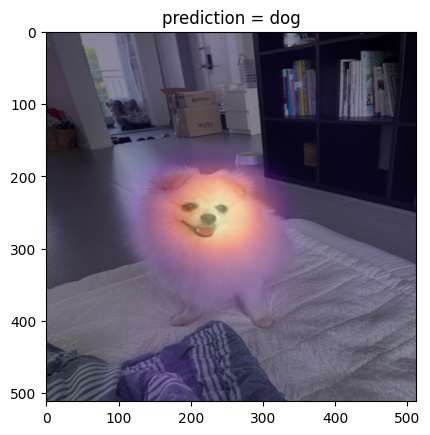

In [655]:
x = resize(to_tensor(hani_pil)).reshape(1,3,512,512).to("cuda:0")
if net(x)>0:
    pred = "dog"
    why = _linr(stem(x))
else:
    pred = "cat" 
    why = - _linr(stem(x))
why_resized = torch.nn.functional.interpolate(
    why,
    size=(512, 512),
    mode='bilinear',
    align_corners=False
)
plt.imshow(x.squeeze().permute(1,2,0).cpu().detach())
plt.imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)
plt.title(f"prediction = {pred}");

`-` 시각화4

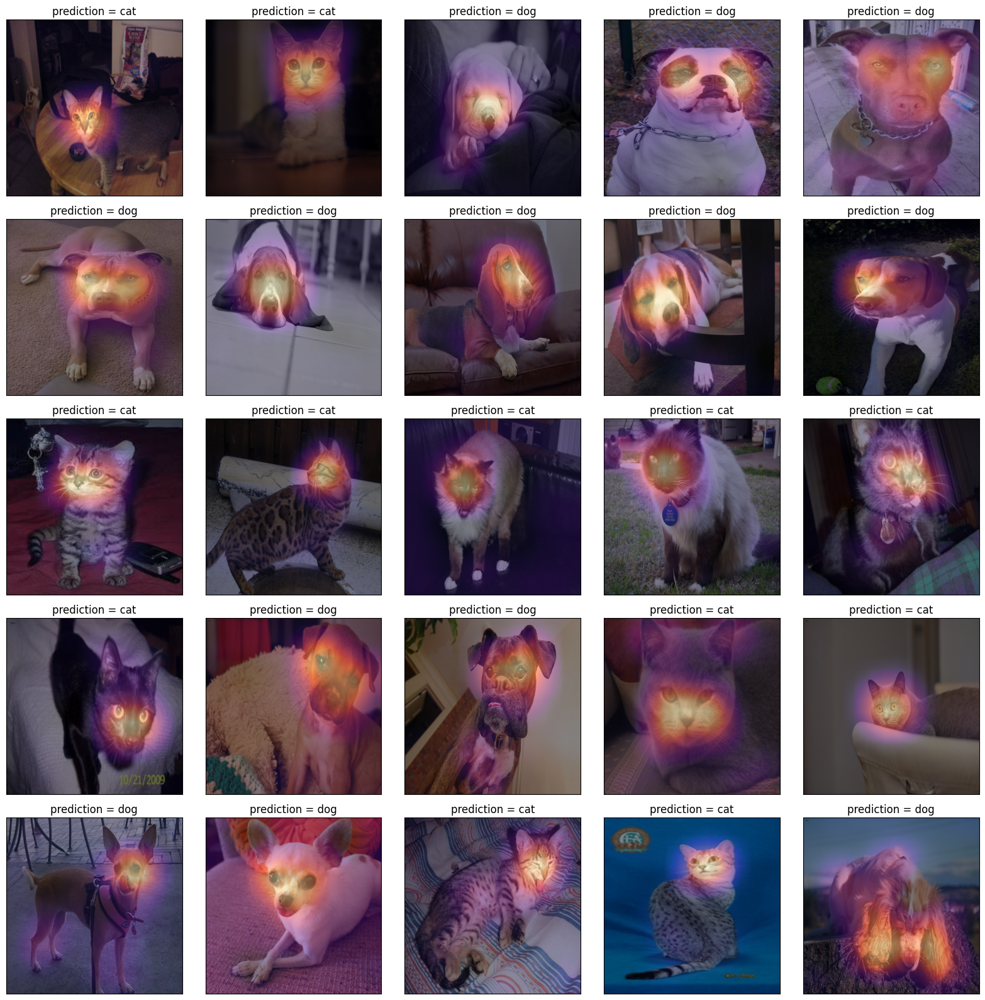

In [661]:
fig,ax = plt.subplots(5,5)
#---#
k=0
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x)>0:
            pred = "dog"
            why = _linr(stem(x))
        else:
            pred = "cat" 
            why = - _linr(stem(x))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512, 512),
            mode='bilinear',
            align_corners=False
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu().detach())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)        
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])    
        ax[i][j].set_title(f"prediction = {pred}"); 
        k=k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

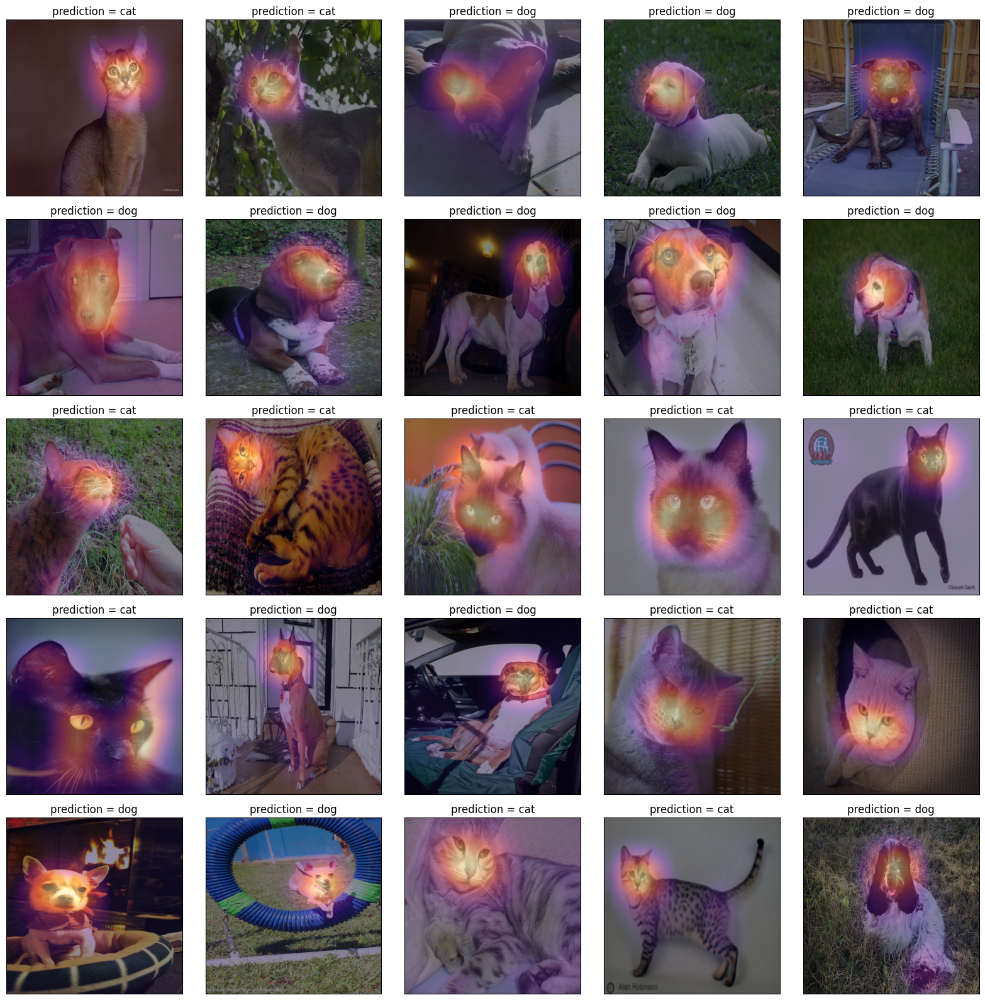

In [662]:
fig,ax = plt.subplots(5,5)
#---#
k=25
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x)>0:
            pred = "dog"
            why = _linr(stem(x))
        else:
            pred = "cat" 
            why = - _linr(stem(x))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512, 512),
            mode='bilinear',
            align_corners=False
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu().detach())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)        
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])    
        ax[i][j].set_title(f"prediction = {pred}"); 
        k=k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

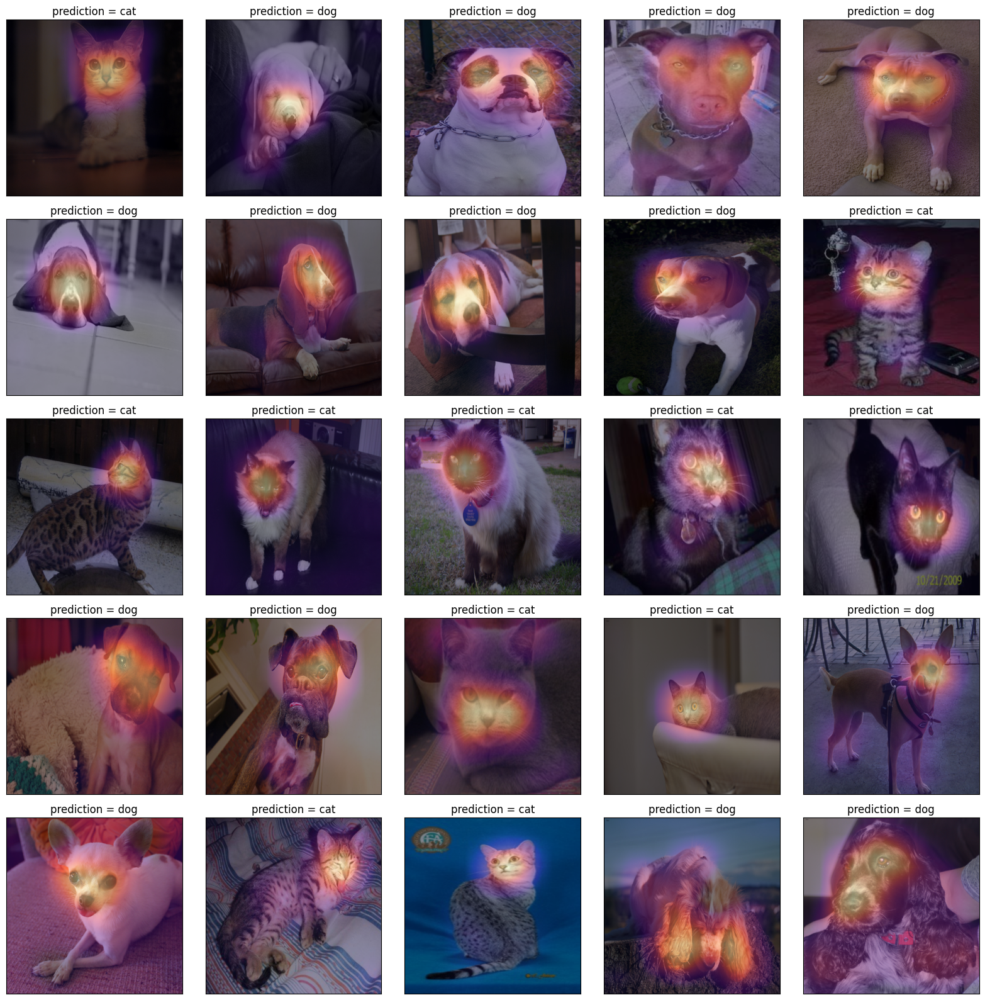

In [663]:
fig,ax = plt.subplots(5,5)
#---#
k=50
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x)>0:
            pred = "dog"
            why = _linr(stem(x))
        else:
            pred = "cat" 
            why = - _linr(stem(x))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512, 512),
            mode='bilinear',
            align_corners=False
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu().detach())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)        
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])    
        ax[i][j].set_title(f"prediction = {pred}"); 
        k=k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

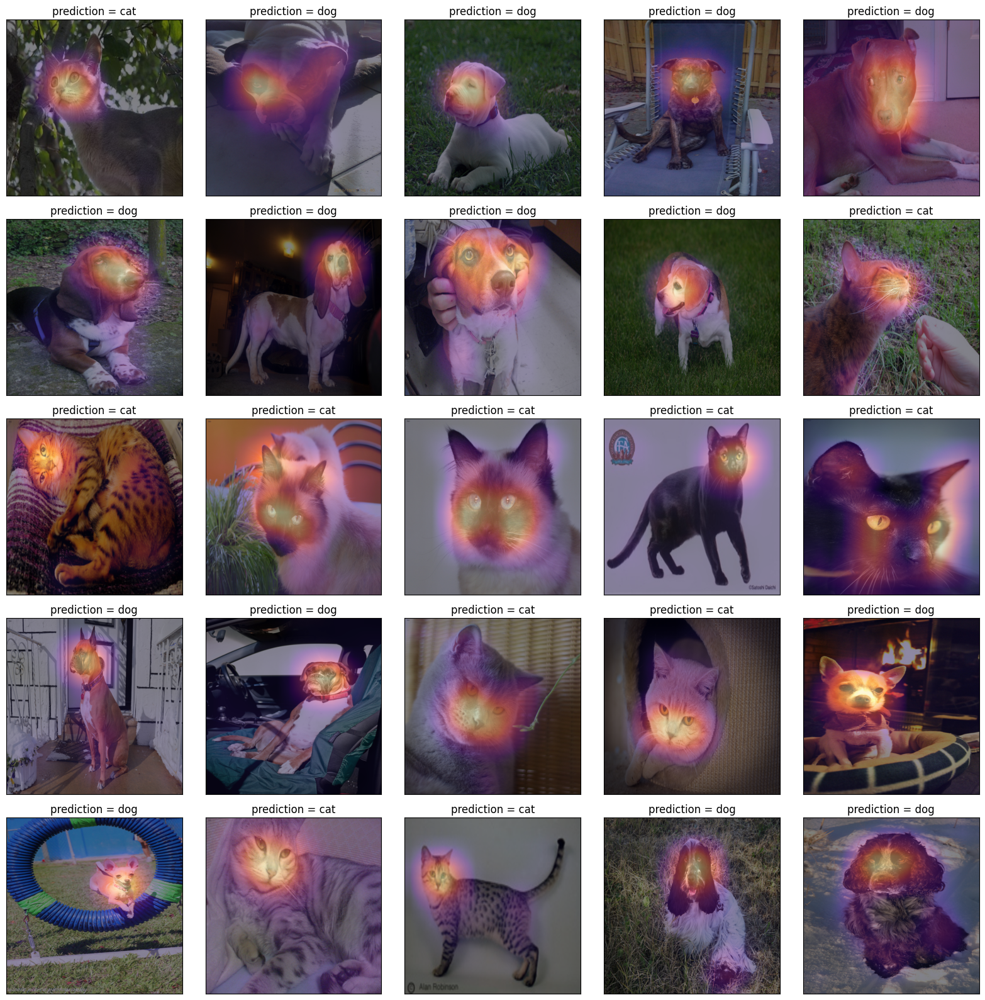

In [664]:
fig,ax = plt.subplots(5,5)
#---#
k=75
for i in range(5):
    for j in range(5):
        x = XX[[k]].to("cuda:0")
        if net(x)>0:
            pred = "dog"
            why = _linr(stem(x))
        else:
            pred = "cat" 
            why = - _linr(stem(x))
        why_resized = torch.nn.functional.interpolate(
            why,
            size=(512, 512),
            mode='bilinear',
            align_corners=False
        )
        ax[i][j].imshow(x.squeeze().permute(1,2,0).cpu().detach())
        ax[i][j].imshow(why_resized.squeeze().cpu().detach(),cmap="magma",alpha=0.5)        
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])    
        ax[i][j].set_title(f"prediction = {pred}"); 
        k=k+50
fig.set_figheight(16)
fig.set_figwidth(16)
fig.tight_layout()

# 7. CAM의 한계

`-` 구조의 제약이 있음

-   AP 와 LINR 로 구성된 net만 가능
-   그렇지 않은 네트워크는 임의로 CAM 을 위한 구조로 만들어야함

`-` 이후에 등장한 grad-cam의 경우 구조의 제약없이 거의 모든 CNN에
적용가능

Zhou, Bolei, Aditya Khosla, Agata Lapedriza, Aude Oliva, and Antonio
Torralba. 2016. “Learning Deep Features for Discriminative
Localization.” In *Proceedings of the IEEE Conference on Computer Vision
and Pattern Recognition*, 2921–29.